ENG335

Machine Learning

Group-based Assignment

July 2023

T-Group & Team No. : T01 & Group 3

Date of Submission : 16/09/2023

Leader: Louis Lim Kiat Yang (PI No. Y2110218)

Members:

- B Harippriya (PI No. K2170295)
- Kang Jun Jie, Justin (PI No. B2211041 )
- Tan Zhen Xuan (PI No. Q2110723)
- Soon Yong Quan (PI No. H2172212)

Dataset used is train.csv.
- Perform exploratory data analysis.
- Identify the algorithm suitable for identification of the mobile price range, using what has been covered in the seminars.
- Identify which number corresponds to the highest mobile price.
  - Ans: The number 3 corresponds to the highest mobile price. (based on Kaggle)
- Present performance metrics.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, classification_report, confusion_matrix

In [ ]:
# Used to upload local files into Colab
from google.colab import files
uploaded = files.upload()

Saving train.csv to train.csv


## Exploratory Data Analysis

### Analysis of full dataset

In [ ]:
# Exploratory Data Analysis using pandas
# After the upload shown in the previous line of code,
# the train.csv dataset can be found under files, in the content folder
data = pd.read_csv("/content/train.csv")

In [ ]:
print(data.keys())

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')


By using .keys() on the dataset, we can observe that there are 21 columns (Attributes).
<br>
The following information are obtained from the kaggle website of the specified dataset.
1. battery_power - Total energy a battery can store in one time measured in mAh
2. blue - Has bluetooth or not
3. clock_speed - speed at which microprocessor executes instructions
4. dual_sim - Has dual-sim support or not
5. fc - Front camera megapixels
6. four_g - Has 4G or not
7. int_memory - Internal memory in Gigabytes
8. m_dep - Mobile depth in cm
9. mobile_wt - Weight of mobile phones, in grams?
10. n_cores - Number of cores of processor
11. pc - Primary camera mega pixels
12. px_height - Pixel resolution height
13. px_width - Pixel resolution width
14. ram - Random Access Memory in Megabytes
15. sc_h - Screen height of mobile in cm
16. sc_w - Screen width of mobile in cm
17. talk_time - Longest time that a single battery charge will last when you are talking on the phone
18. three_g - Has 3G or not
19. touch_screen - Has touch screen or not
20. wifi - Has wifi or not
21. price_range - Target variable (0 = Low cost, 1 = Medium cost, 2 = High cost and 3 = Very High cost)

In [ ]:
data.shape

(2000, 21)

The dataset has 21 columns and 2000 rows.

In [ ]:
#Display the first 5 rows of the dataset
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
#Display the last 5 rows of the dataset
data.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


In [ ]:
data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
data.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

Using the .isna() function together with the .sum() function, we can observe that there are no NA values in the dataset.

In [ ]:
data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

Using the .isnull() function together with the .sum() function, we can observe that there are no Null values in the dataset.

### Splitting of dataset for further analysis

In [ ]:
#Separate the target column of the dataset into a new Dataframe
target = data[["price_range"]]
target.head(10)

,price_range
0,1
1,2
2,2
3,2
4,1
5,1
6,3
7,0
8,0
9,0


We have the required target column to use for the training and testing done later on.

In [ ]:
#Prepare the other columns by removing target from the dataset
data = data.drop(columns=["price_range"])
data.head(10)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0
5,1859,0,0.5,1,3,0,22,0.7,164,1,7,1004,1654,1067,17,1,10,1,0,0
6,1821,0,1.7,0,4,1,10,0.8,139,8,10,381,1018,3220,13,8,18,1,0,1
7,1954,0,0.5,1,0,0,24,0.8,187,4,0,512,1149,700,16,3,5,1,1,1
8,1445,1,0.5,0,0,0,53,0.7,174,7,14,386,836,1099,17,1,20,1,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,15,1137,1224,513,19,10,12,1,0,0


In [ ]:
data.shape

(2000, 20)

We have the required data columns to use for training and testing.

In [ ]:
#Split the dataset into 8:2 ratio
#Random state not set. Set an int value for reproducible output
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2)

#Doublecheck the dimensions of training and testing data
print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)
print("Y_train: ", Y_train.shape)
print("Y_test: ", Y_test.shape)

X_train:  (1600, 20)
X_test:  (400, 20)
Y_train:  (1600, 1)
Y_test:  (400, 1)


In [ ]:
X_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
1385,1805,1,0.5,0,0,0,29,0.2,182,4,2,758,891,1276,19,4,17,0,1,0
932,1485,0,2.8,0,3,1,44,0.1,138,4,14,341,774,3271,14,12,8,1,1,0
633,1231,0,1.2,1,5,0,54,0.8,185,3,10,632,1184,1762,5,3,6,1,1,0
1897,1075,0,0.5,1,2,0,11,0.2,122,1,16,271,1769,3927,8,3,7,1,0,0
1960,1063,0,2.0,0,0,0,27,0.2,86,6,7,201,582,2668,12,5,19,0,0,0


In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1600 entries, 1385 to 1779
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  1600 non-null   int64  
 1   blue           1600 non-null   int64  
 2   clock_speed    1600 non-null   float64
 3   dual_sim       1600 non-null   int64  
 4   fc             1600 non-null   int64  
 5   four_g         1600 non-null   int64  
 6   int_memory     1600 non-null   int64  
 7   m_dep          1600 non-null   float64
 8   mobile_wt      1600 non-null   int64  
 9   n_cores        1600 non-null   int64  
 10  pc             1600 non-null   int64  
 11  px_height      1600 non-null   int64  
 12  px_width       1600 non-null   int64  
 13  ram            1600 non-null   int64  
 14  sc_h           1600 non-null   int64  
 15  sc_w           1600 non-null   int64  
 16  talk_time      1600 non-null   int64  
 17  three_g        1600 non-null   int64  
 18  touch

In [ ]:
X_test.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
1122,1871,0,2.1,0,4,1,41,0.4,144,8,5,275,1966,2727,15,8,11,1,0,0
1282,609,1,0.5,0,4,1,10,0.1,81,6,6,113,1524,1905,16,3,18,1,1,1
1587,1093,0,0.5,0,1,1,31,0.6,171,2,12,1310,1420,1646,12,0,6,1,1,0
1152,1009,1,1.0,1,2,0,2,0.6,102,8,14,912,1043,1716,7,5,15,0,0,0
1541,823,0,1.0,1,9,1,18,0.2,182,5,16,1180,1350,3894,13,10,9,1,1,0


In [ ]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 1122 to 1495
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  400 non-null    int64  
 1   blue           400 non-null    int64  
 2   clock_speed    400 non-null    float64
 3   dual_sim       400 non-null    int64  
 4   fc             400 non-null    int64  
 5   four_g         400 non-null    int64  
 6   int_memory     400 non-null    int64  
 7   m_dep          400 non-null    float64
 8   mobile_wt      400 non-null    int64  
 9   n_cores        400 non-null    int64  
 10  pc             400 non-null    int64  
 11  px_height      400 non-null    int64  
 12  px_width       400 non-null    int64  
 13  ram            400 non-null    int64  
 14  sc_h           400 non-null    int64  
 15  sc_w           400 non-null    int64  
 16  talk_time      400 non-null    int64  
 17  three_g        400 non-null    int64  
 18  touch_

In [ ]:
Y_train.head()

,price_range
1385,1
932,3
633,1
1897,3
1960,2


In [ ]:
Y_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1600 entries, 1385 to 1779
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   price_range  1600 non-null   int64
dtypes: int64(1)
memory usage: 25.0 KB


In [ ]:
Y_test.head()

,price_range
1122,3
1282,1
1587,1
1152,1
1541,3


In [ ]:
Y_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 1122 to 1495
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   price_range  400 non-null    int64
dtypes: int64(1)
memory usage: 6.2 KB


### Further analysis using test dataset

In [ ]:
#Combine the X_train and Y_Train dataset
fadata = X_train.copy(deep = True) #fa for further analysis
fadata["price_range"] = Y_train
fadata.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1385,1805,1,0.5,0,0,0,29,0.2,182,4,...,758,891,1276,19,4,17,0,1,0,1
932,1485,0,2.8,0,3,1,44,0.1,138,4,...,341,774,3271,14,12,8,1,1,0,3
633,1231,0,1.2,1,5,0,54,0.8,185,3,...,632,1184,1762,5,3,6,1,1,0,1
1897,1075,0,0.5,1,2,0,11,0.2,122,1,...,271,1769,3927,8,3,7,1,0,0,3
1960,1063,0,2.0,0,0,0,27,0.2,86,6,...,201,582,2668,12,5,19,0,0,0,2


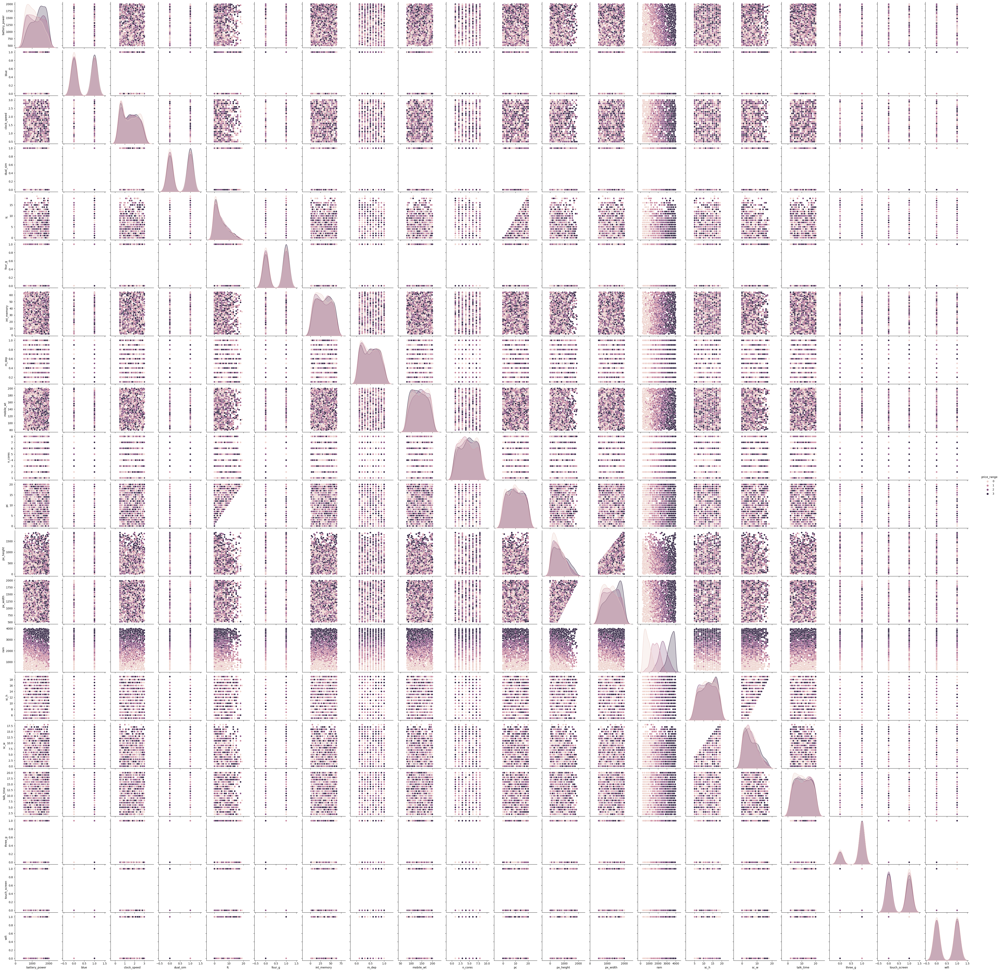

In [ ]:
sns.pairplot(fadata, hue="price_range")

In [ ]:
#A correlation matrix will be used to identify the correlation between the idependent and target variables.
corr = fadata.corr()
corr.style.background_gradient(cmap = "coolwarm")

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.006008,-0.011263,-0.030970,0.026327,0.012798,-0.013498,0.034374,-0.006779,-0.013407,0.040036,0.010651,0.003537,0.009897,-0.038584,-0.021719,0.049110,0.008289,0.013824,-0.007413,0.210952
blue,0.006008,1.000000,0.006491,0.045079,0.001568,0.020359,0.038180,0.007564,-0.016665,0.048848,-0.004216,-0.007343,-0.027444,0.043476,-0.003176,0.007871,0.020661,-0.023310,0.011297,-0.021204,0.032630
clock_speed,-0.011263,0.006491,1.000000,0.004749,-0.015784,-0.022150,-0.005096,-0.003264,-0.008790,-0.002135,-0.019062,-0.004763,0.000612,0.002315,-0.026371,-0.002379,-0.005317,-0.036129,0.013880,-0.010735,-0.006620
dual_sim,-0.030970,0.045079,0.004749,1.000000,-0.016584,-0.000450,-0.016779,0.001565,-0.004992,-0.034074,0.000812,-0.020423,0.017982,0.062338,-0.015809,-0.018805,-0.049050,-0.013594,-0.021314,0.021189,0.036264
fc,0.026327,0.001568,-0.015784,-0.016584,1.000000,-0.026968,-0.041467,-0.005794,0.039002,-0.037162,0.660903,-0.003880,-0.001686,0.008053,-0.015787,-0.015792,-0.026454,-0.011559,-0.022856,0.012498,0.014795
four_g,0.012798,0.020359,-0.022150,-0.000450,-0.026968,1.000000,-0.002889,-0.000881,-0.002775,-0.019084,-0.006332,-0.008210,0.023501,0.021359,0.024006,0.040358,-0.040712,0.580783,0.015985,-0.004035,0.036902
int_memory,-0.013498,0.038180,-0.005096,-0.016779,-0.041467,-0.002889,1.000000,0.023492,-0.063297,-0.001840,-0.039242,0.027794,0.005273,0.025061,0.052044,0.027332,-0.001641,-0.024038,-0.033920,0.001297,0.040705
m_dep,0.034374,0.007564,-0.003264,0.001565,-0.005794,-0.000881,0.023492,1.000000,0.040070,-0.005654,0.030221,0.031210,0.029557,0.000004,-0.041022,-0.028947,0.019135,-0.011739,-0.020596,-0.026675,0.012361
mobile_wt,-0.006779,-0.016665,-0.008790,-0.004992,0.039002,-0.002775,-0.063297,0.040070,1.000000,-0.014221,0.035284,-0.006024,0.012966,-0.011968,-0.020153,-0.019497,0.026254,0.007444,-0.021899,0.002905,-0.037337
n_cores,-0.013407,0.048848,-0.002135,-0.034074,-0.037162,-0.019084,-0.001840,-0.005654,-0.014221,1.000000,-0.016144,-0.004928,0.024032,0.019367,-0.004298,0.017317,0.018787,-0.003655,0.031166,-0.004564,0.019259


Further plotting will be done for independent variables with noticeable correlation with the target variable, such as;
- RAM
- Battery Power
- Pixel Width
- Pixel Height

#### RAM vs Price Range

<Axes: xlabel='price_range', ylabel='ram'>

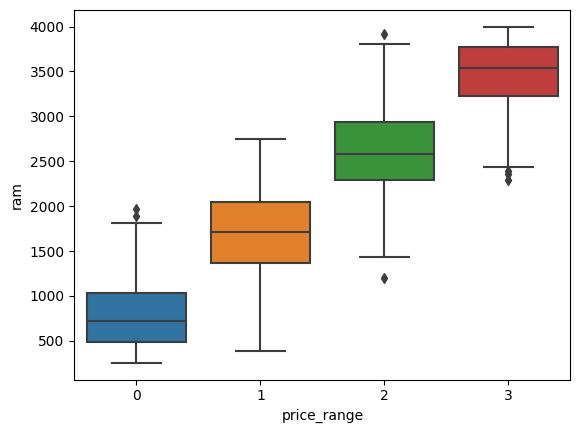

In [ ]:
sns.boxplot(x = "price_range", y = "ram", data = fadata)

#### Battery Power vs Price Range

<Axes: xlabel='price_range', ylabel='battery_power'>

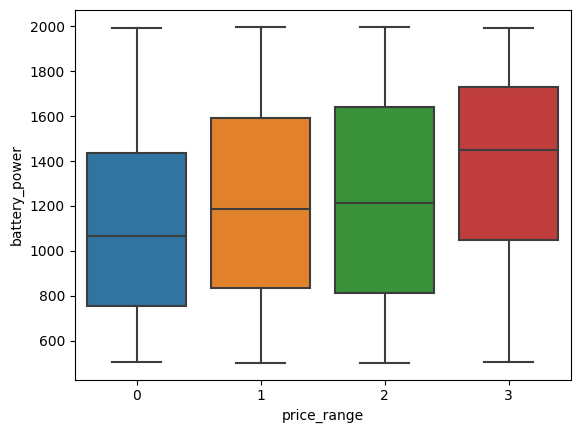

In [ ]:
sns.boxplot(x = "price_range", y = "battery_power", data = fadata)

#### Pixel Width vs Price Range

<Axes: xlabel='price_range', ylabel='px_width'>

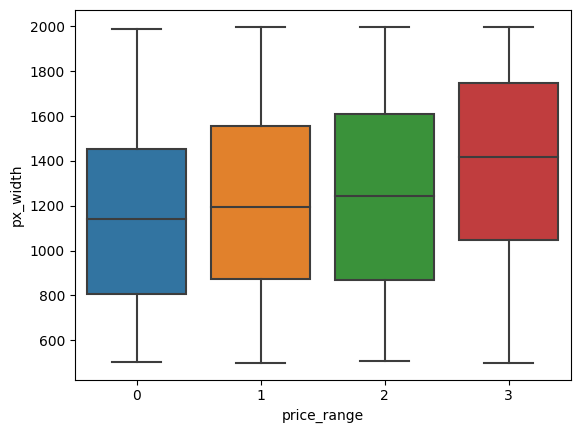

In [ ]:
sns.boxplot(x = "price_range", y = "px_width", data = fadata)

#### Pixel Height vs Price Range

<Axes: xlabel='price_range', ylabel='px_height'>

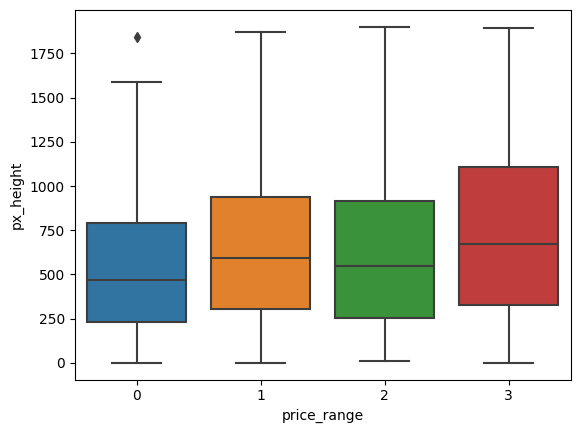

In [ ]:
sns.boxplot(x = "price_range", y = "px_height", data = fadata)

## Create and Train model

As the target variable, "price_range", is a categorical value, we will have to use a classification model.

As of 10/09/23, we have only went through Logistic Regression and Naive Bayes algorithms.

Both algorithms will be created and trained on the following training datasets;
- Training dataset with no scaling
- Training dataset with StandardScaling
- Training dataset with MinMaxScaling
- Training dataset with 4 highest correlated columns and no scaling
- Training dataset with 4 highest correlated columns and StandardScaling
- Training dataset with 4 highest correlated columns and MinMaxScaling

Each model will then be compared to one another using the test dataset.

The comparison will be made using the accuracy score of the model.

### Preparing datasets

#### Training dataset with no scaling

In [ ]:
X_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
1385,1805,1,0.5,0,0,0,29,0.2,182,4,2,758,891,1276,19,4,17,0,1,0
932,1485,0,2.8,0,3,1,44,0.1,138,4,14,341,774,3271,14,12,8,1,1,0
633,1231,0,1.2,1,5,0,54,0.8,185,3,10,632,1184,1762,5,3,6,1,1,0
1897,1075,0,0.5,1,2,0,11,0.2,122,1,16,271,1769,3927,8,3,7,1,0,0
1960,1063,0,2.0,0,0,0,27,0.2,86,6,7,201,582,2668,12,5,19,0,0,0


In [ ]:
Y_train.head()

,price_range
1385,1
932,3
633,1
1897,3
1960,2


#### Training dataset with 4 highest correlated columns and no scaling

In [ ]:
# sel is the dataset's 4 highest correlated columns linked to the price_range
sel = ['ram', 'battery_power', 'px_width', 'px_height']
X_sel_train = X_train[sel]
X_sel_test = X_test[sel]
X_sel_train.head()

,ram,battery_power,px_width,px_height
1385,1276,1805,891,758
932,3271,1485,774,341
633,1762,1231,1184,632
1897,3927,1075,1769,271
1960,2668,1063,582,201


#### Training dataset with StandardScaling

In [ ]:
scaler = StandardScaler()
X_scale_train = scaler.fit_transform(X_train)
X_scale_test = scaler.transform(X_test)

#### Training dataset with 4 highest correlated columns and StandardScaling

In [ ]:
scaler_sel = StandardScaler()
X_sel_scale_train = scaler_sel.fit_transform(X_sel_train)
X_sel_scale_test = scaler_sel.transform(X_sel_test)

#### Training dataset with MinMaxScaling

In [ ]:
minmax = MinMaxScaler()
X_minmax_train = minmax.fit_transform(X_train)
X_minmax_test = minmax.transform(X_test)

#### Training dataset with 4 highest correlated columns and MinMaxScaling

In [ ]:
minmax_sel = MinMaxScaler()
X_sel_minmax_train = minmax_sel.fit_transform(X_sel_train)
X_sel_minmax_test = minmax_sel.transform(X_sel_test)

### Logistic Regression model

#### Dataset with no scaling

In [ ]:
clf = LogisticRegression(max_iter = 1000)
clf.fit(X_train, Y_train)
y_clf_pred = clf.predict(X_test)
print(f"Accuracy: {accuracy_score(y_clf_pred, Y_test):.2f}")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.70


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
print(classification_report(Y_test, y_clf_pred))

              precision    recall  f1-score   support

           0       0.83      0.88      0.86        84
           1       0.67      0.68      0.68       103
           2       0.58      0.56      0.57       111
           3       0.74      0.74      0.74       102

    accuracy                           0.70       400
   macro avg       0.71      0.71      0.71       400
weighted avg       0.70      0.70      0.70       400



In [ ]:
cm = confusion_matrix(Y_test, y_clf_pred)
print(cm)

[[74 10  0  0]
 [14 70 18  1]
 [ 1 23 62 25]
 [ 0  1 26 75]]


Text(0.5, 1.0, 'Logistic Regression CM using full dataset without normalization')

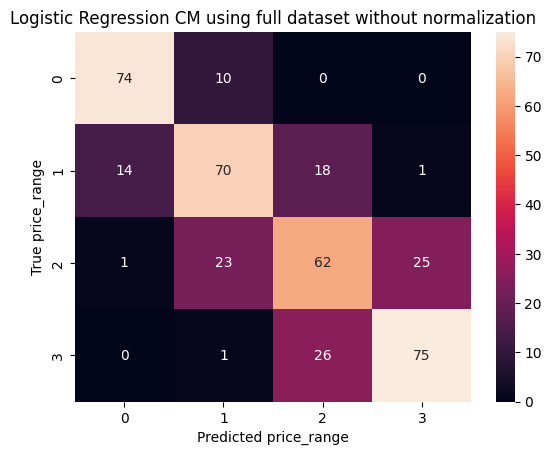

In [ ]:
ax = plt.subplot()

sns.heatmap(cm, annot = True, ax = ax)
ax.set_xlabel("Predicted price_range")
ax.set_ylabel("True price_range")
ax.set_title("Logistic Regression CM using full dataset without normalization")

#### Dataset with Standard Scaling

In [ ]:
# Create logistic regression object
clf_scale = LogisticRegression(max_iter = 1000)

# Train the model using the training sets
clf_scale.fit(X_scale_train, Y_train)

# Make predictions using the testing set
Y_scale_clf_pred = clf_scale.predict(X_scale_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_scale_clf_pred, Y_test))

Accuracy: 0.95


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_scale_clf_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98        84
           1       0.93      0.96      0.95       103
           2       0.94      0.92      0.93       111
           3       0.96      0.97      0.97       102

    accuracy                           0.95       400
   macro avg       0.96      0.96      0.96       400
weighted avg       0.96      0.95      0.95       400



In [ ]:
clf_scale_cm = confusion_matrix(Y_test, Y_scale_clf_pred) # Actual price_range, Predicted price_range
print(clf_scale_cm)

[[ 82   2   0   0]
 [  1  99   3   0]
 [  0   5 102   4]
 [  0   0   3  99]]


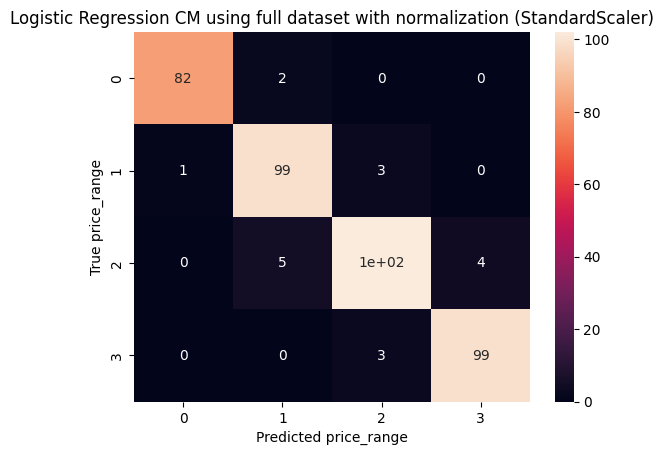

In [ ]:
clf_scale_ax = plt.subplot()

sns.heatmap(clf_scale_cm, annot=True, ax=clf_scale_ax);
# labels and title
clf_scale_ax.set_xlabel('Predicted price_range');
clf_scale_ax.set_ylabel('True price_range');
clf_scale_ax.set_title('Logistic Regression CM using full dataset with normalization (StandardScaler)');

#### Dataset with MinMax Scaling

In [ ]:
# Create logistic regression object
clf_minmax = LogisticRegression(max_iter = 2000)

# Train the model using the training sets
clf_minmax.fit(X_minmax_train, Y_train)

# Make predictions using the testing set
Y_minmax_clf_pred = clf_minmax.predict(X_minmax_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_minmax_clf_pred, Y_test))

Accuracy: 0.91


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_minmax_clf_pred))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        84
           1       0.84      0.89      0.87       103
           2       0.93      0.81      0.87       111
           3       0.93      0.98      0.95       102

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.91      0.91      0.90       400



In [ ]:
clf_minmax_cm = confusion_matrix(Y_test, Y_minmax_clf_pred) # Actual price_range, Predicted price_range
print(clf_minmax_cm)

[[ 80   4   0   0]
 [  6  92   5   0]
 [  0  13  90   8]
 [  0   0   2 100]]


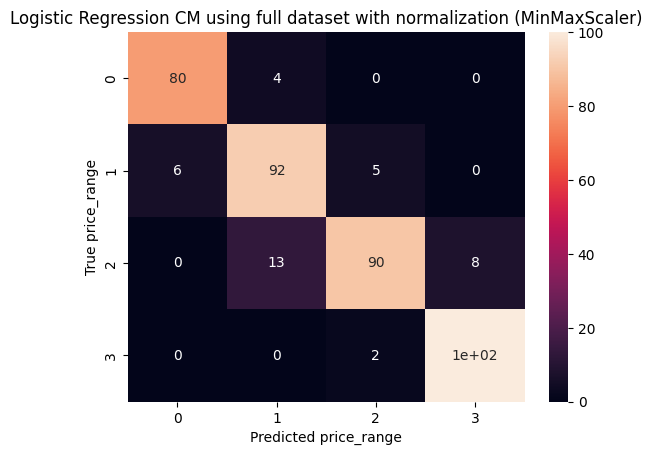

In [ ]:
clf_minmax_ax = plt.subplot()

sns.heatmap(clf_minmax_cm, annot=True, ax=clf_minmax_ax);
# labels and title
clf_minmax_ax.set_xlabel('Predicted price_range');
clf_minmax_ax.set_ylabel('True price_range');
clf_minmax_ax.set_title('Logistic Regression CM using full dataset with normalization (MinMaxScaler)');

#### Dataset with selected columns, no scaling

In [ ]:
clf_sel = LogisticRegression(max_iter = 1000)
clf_sel.fit(X_sel_train, Y_train)
Y_sel_clf_pred = clf_sel.predict(X_sel_test)
print(f"Accuracy: {accuracy_score(Y_sel_clf_pred, Y_test):.2f}")

Accuracy: 0.95


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_sel_clf_pred))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97        84
           1       0.94      0.96      0.95       103
           2       0.92      0.95      0.93       111
           3       0.96      0.94      0.95       102

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



In [ ]:
clf_sel_cm = confusion_matrix(Y_test, Y_sel_clf_pred) # Actual price_range, Predicted price_range
print(clf_sel_cm)

[[ 80   4   0   0]
 [  1  99   3   0]
 [  0   2 105   4]
 [  0   0   6  96]]


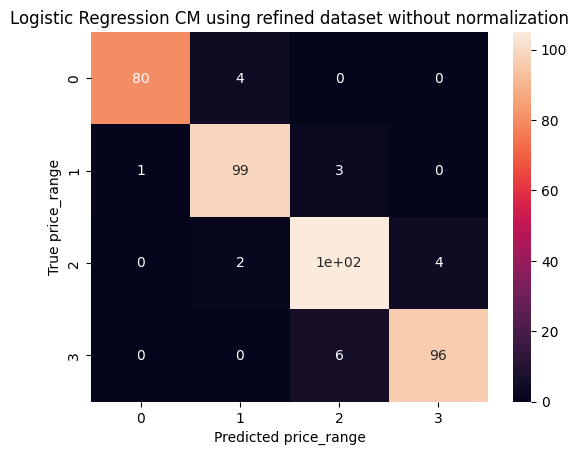

In [ ]:
clf_sel_ax = plt.subplot()

sns.heatmap(clf_sel_cm, annot=True, ax=clf_sel_ax);
# labels and title
clf_sel_ax.set_xlabel('Predicted price_range');
clf_sel_ax.set_ylabel('True price_range');
clf_sel_ax.set_title('Logistic Regression CM using refined dataset without normalization');

#### Dataset with selected columns, Standard Scaling

In [ ]:
# Create logistic regression object
clf_sel_scale = LogisticRegression(max_iter = 2000)

# Train the model using the training sets
clf_sel_scale.fit(X_sel_scale_train, Y_train)

# Make predictions using the testing set
Y_sel_scale_clf_pred = clf_sel_scale.predict(X_sel_scale_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_sel_scale_clf_pred, Y_test))

Accuracy: 0.95


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_sel_scale_clf_pred))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97        84
           1       0.94      0.98      0.96       103
           2       0.94      0.94      0.94       111
           3       0.96      0.94      0.95       102

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



In [ ]:
clf_sel_scale_cm = confusion_matrix(Y_test, Y_sel_scale_clf_pred) # Actual price_range, Predicted price_range
print(clf_sel_scale_cm)

[[ 80   4   0   0]
 [  1 101   1   0]
 [  0   3 104   4]
 [  0   0   6  96]]


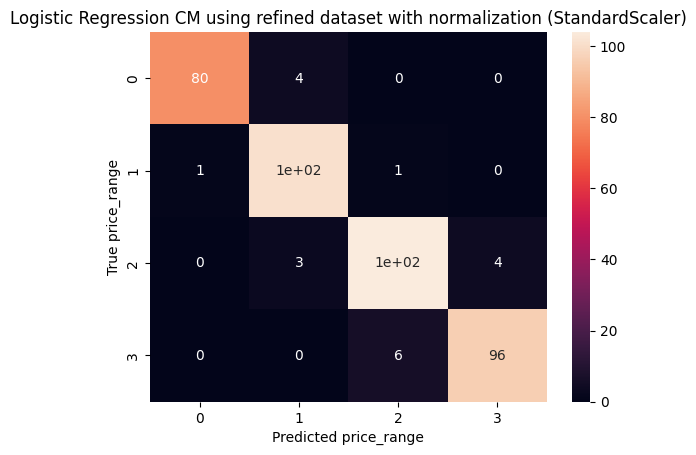

In [ ]:
clf_sel_scale_ax = plt.subplot()

sns.heatmap(clf_sel_scale_cm, annot=True, ax=clf_sel_scale_ax);
# labels and title
clf_sel_scale_ax.set_xlabel('Predicted price_range');
clf_sel_scale_ax.set_ylabel('True price_range');
clf_sel_scale_ax.set_title('Logistic Regression CM using refined dataset with normalization (StandardScaler)');

#### Dataset with selected columns, MinMax Scaling

In [ ]:
# Create logistic regression object
clf_sel_minmax = LogisticRegression(max_iter = 2000)

# Train the model using the training sets
clf_sel_minmax.fit(X_sel_minmax_train, Y_train)

# Make predictions using the testing set
Y_sel_minmax_clf_pred = clf_sel_minmax.predict(X_sel_minmax_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_sel_minmax_clf_pred, Y_test))

Accuracy: 0.93


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_sel_minmax_clf_pred))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96        84
           1       0.91      0.89      0.90       103
           2       0.92      0.87      0.89       111
           3       0.95      0.95      0.95       102

    accuracy                           0.93       400
   macro avg       0.93      0.93      0.93       400
weighted avg       0.92      0.93      0.92       400



In [ ]:
clf_sel_minmax_cm = confusion_matrix(Y_test, Y_sel_minmax_clf_pred) # Actual price_range, Predicted price_range
print(clf_sel_minmax_cm)

[[84  0  0  0]
 [ 7 92  4  0]
 [ 0  9 97  5]
 [ 0  0  5 97]]


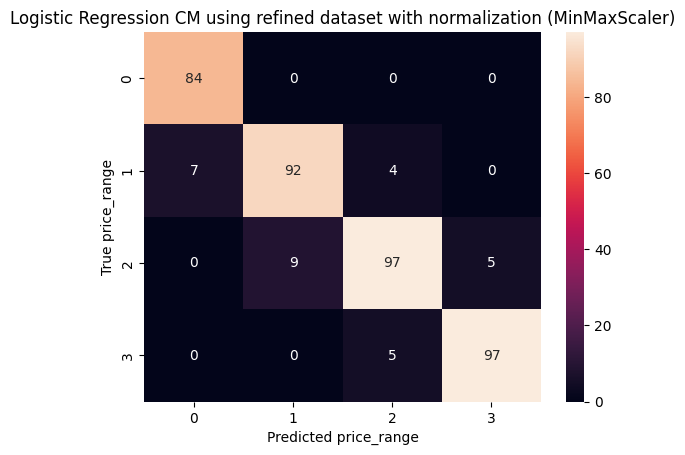

In [ ]:
clf_sel_minmax_ax = plt.subplot()

sns.heatmap(clf_sel_minmax_cm, annot=True, ax=clf_sel_minmax_ax);
# labels and title
clf_sel_minmax_ax.set_xlabel('Predicted price_range');
clf_sel_minmax_ax.set_ylabel('True price_range');
clf_sel_minmax_ax.set_title('Logistic Regression CM using refined dataset with normalization (MinMaxScaler)');

### Naive Bayes model

#### Dataset with no scaling

In [ ]:
gnb = GaussianNB()
gnb.fit(X_train, Y_train)
Y_gnb_pred = gnb.predict(X_test)
print(f"Accuracy: {accuracy_score(Y_gnb_pred, Y_test):.2f}")

Accuracy: 0.81


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_gnb_pred))

              precision    recall  f1-score   support

           0       0.83      0.93      0.88        84
           1       0.72      0.71      0.71       103
           2       0.75      0.75      0.75       111
           3       0.94      0.86      0.90       102

    accuracy                           0.81       400
   macro avg       0.81      0.81      0.81       400
weighted avg       0.81      0.81      0.80       400



In [ ]:
gnb_cm = confusion_matrix(Y_test, Y_gnb_pred)
print(gnb_cm)

[[78  6  0  0]
 [16 73 14  0]
 [ 0 22 83  6]
 [ 0  1 13 88]]


Text(0.5, 1.0, 'Naive Bayes CM using full dataset without normalization')

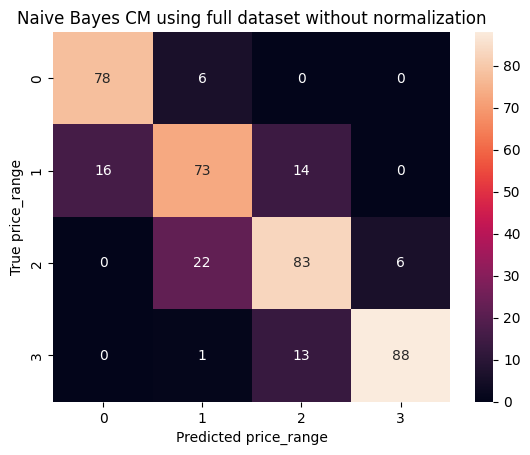

In [ ]:
gnb_ax = plt.subplot()

sns.heatmap(gnb_cm, annot = True, ax = gnb_ax)
gnb_ax.set_xlabel("Predicted price_range")
gnb_ax.set_ylabel("True price_range")
gnb_ax.set_title("Naive Bayes CM using full dataset without normalization")

#### Dataset with Standard Scaling

In [ ]:
# Create naive bayes object
gnb_scale = GaussianNB()

# Train the model using the training sets
gnb_scale.fit(X_scale_train, Y_train)

# Make predictions using the testing set
Y_scale_gnb_pred = gnb_scale.predict(X_scale_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_scale_gnb_pred, Y_test))

Accuracy: 0.81


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_scale_gnb_pred))

              precision    recall  f1-score   support

           0       0.83      0.93      0.88        84
           1       0.72      0.71      0.71       103
           2       0.75      0.75      0.75       111
           3       0.94      0.86      0.90       102

    accuracy                           0.81       400
   macro avg       0.81      0.81      0.81       400
weighted avg       0.81      0.81      0.80       400



In [ ]:
gnb_scale_cm = confusion_matrix(Y_test, Y_scale_gnb_pred) # Actual price_range, Predicted price_range
print(gnb_scale_cm)

[[78  6  0  0]
 [16 73 14  0]
 [ 0 22 83  6]
 [ 0  1 13 88]]


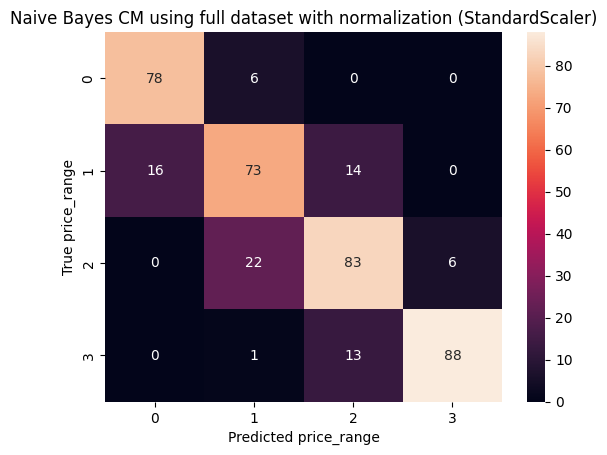

In [ ]:
gnb_scale_ax = plt.subplot()

sns.heatmap(gnb_scale_cm, annot=True, ax=gnb_scale_ax);
# labels and title
gnb_scale_ax.set_xlabel('Predicted price_range');
gnb_scale_ax.set_ylabel('True price_range');
gnb_scale_ax.set_title('Naive Bayes CM using full dataset with normalization (StandardScaler)');

#### Dataset with MinMax Scaling

In [ ]:
# Create naive bayes object
gnb_minmax = GaussianNB()

# Train the model using the training sets
gnb_minmax.fit(X_minmax_train, Y_train)

# Make predictions using the testing set
Y_minmax_gnb_pred = gnb_minmax.predict(X_minmax_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_minmax_gnb_pred, Y_test))

Accuracy: 0.81


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_minmax_gnb_pred))

              precision    recall  f1-score   support

           0       0.83      0.93      0.88        84
           1       0.72      0.71      0.71       103
           2       0.75      0.75      0.75       111
           3       0.94      0.86      0.90       102

    accuracy                           0.81       400
   macro avg       0.81      0.81      0.81       400
weighted avg       0.81      0.81      0.80       400



In [ ]:
gnb_minmax_cm = confusion_matrix(Y_test, Y_minmax_gnb_pred) # Actual price_range, Predicted price_range
print(gnb_minmax_cm)

[[78  6  0  0]
 [16 73 14  0]
 [ 0 22 83  6]
 [ 0  1 13 88]]


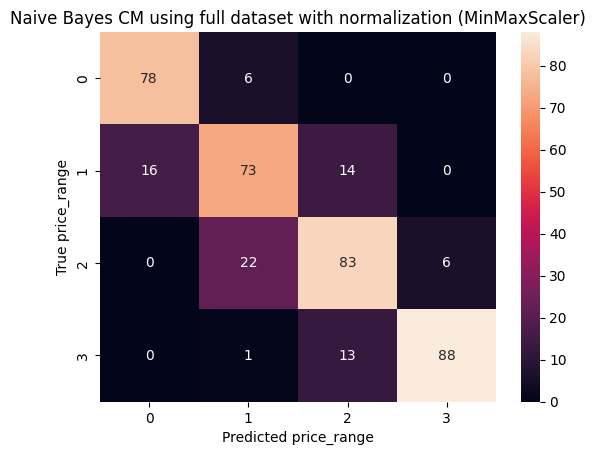

In [ ]:
gnb_minmax_ax = plt.subplot()

sns.heatmap(gnb_minmax_cm, annot=True, ax=gnb_minmax_ax);
# labels and title
gnb_minmax_ax.set_xlabel('Predicted price_range');
gnb_minmax_ax.set_ylabel('True price_range');
gnb_minmax_ax.set_title('Naive Bayes CM using full dataset with normalization (MinMaxScaler)');

#### Dataset with selected columns, no scaling

In [ ]:
# Create naive bayes object
gnb_sel = GaussianNB()

# Train the model using the training sets
gnb_sel.fit(X_sel_train, Y_train)

# Make predictions using the testing set
Y_sel_gnb_pred = gnb_sel.predict(X_sel_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_sel_gnb_pred, Y_test))

Accuracy: 0.78


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_sel_gnb_pred))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88        84
           1       0.70      0.69      0.70       103
           2       0.69      0.73      0.71       111
           3       0.92      0.82      0.87       102

    accuracy                           0.78       400
   macro avg       0.79      0.79      0.79       400
weighted avg       0.79      0.78      0.78       400



In [ ]:
gnb_sel_cm = confusion_matrix(Y_test, Y_sel_gnb_pred) # Actual price_range, Predicted price_range
print(gnb_sel_cm)

[[77  7  0  0]
 [14 71 18  0]
 [ 0 23 81  7]
 [ 0  0 18 84]]


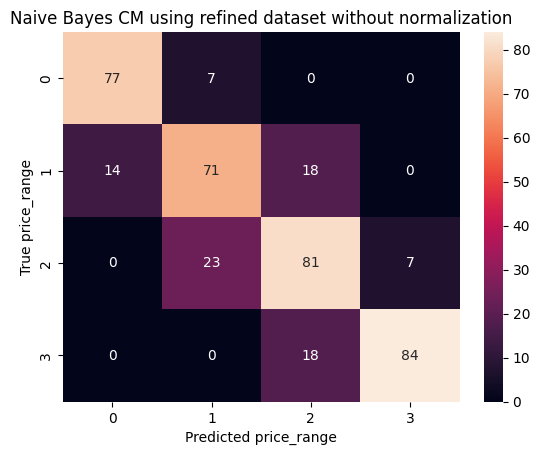

In [ ]:
gnb_sel_ax = plt.subplot()

sns.heatmap(gnb_sel_cm, annot=True, ax=gnb_sel_ax);
# labels and title
gnb_sel_ax.set_xlabel('Predicted price_range');
gnb_sel_ax.set_ylabel('True price_range');
gnb_sel_ax.set_title('Naive Bayes CM using refined dataset without normalization');

#### Dataset with selected columns, Standard Scaling

In [ ]:
# Create naive bayes object
gnb_sel_scale = GaussianNB()

# Train the model using the training sets
gnb_sel_scale.fit(X_sel_scale_train, Y_train)

# Make predictions using the testing set
Y_sel_scale_gnb_pred = gnb_sel_scale.predict(X_sel_scale_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_sel_scale_gnb_pred, Y_test))

Accuracy: 0.78


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_sel_scale_gnb_pred))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88        84
           1       0.70      0.69      0.70       103
           2       0.69      0.73      0.71       111
           3       0.92      0.82      0.87       102

    accuracy                           0.78       400
   macro avg       0.79      0.79      0.79       400
weighted avg       0.79      0.78      0.78       400



In [ ]:
gnb_sel_scale_cm = confusion_matrix(Y_test, Y_sel_scale_gnb_pred) # Actual price_range, Predicted price_range
print(gnb_sel_scale_cm)

[[77  7  0  0]
 [14 71 18  0]
 [ 0 23 81  7]
 [ 0  0 18 84]]


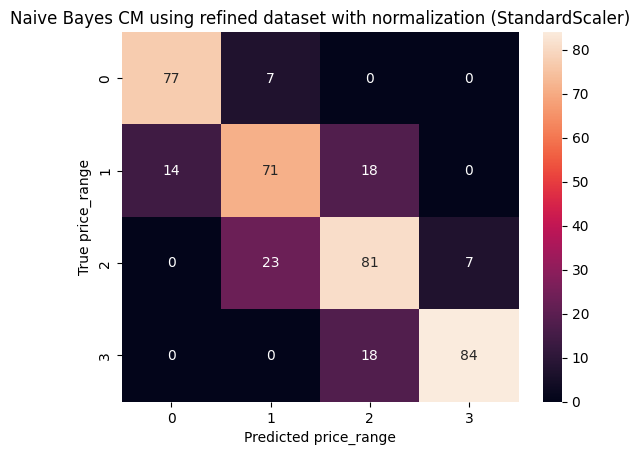

In [ ]:
gnb_sel_scale_ax = plt.subplot()

sns.heatmap(gnb_sel_scale_cm, annot=True, ax=gnb_sel_scale_ax);
# labels and title
gnb_sel_scale_ax.set_xlabel('Predicted price_range');
gnb_sel_scale_ax.set_ylabel('True price_range');
gnb_sel_scale_ax.set_title('Naive Bayes CM using refined dataset with normalization (StandardScaler)');

#### Dataset with selected columns, MinMax Scaling

In [ ]:
# Create naive bayes object
gnb_sel_minmax = GaussianNB()

# Train the model using the training sets
gnb_sel_minmax.fit(X_sel_minmax_train, Y_train)

# Make predictions using the testing set
Y_sel_minmax_gnb_pred = gnb_sel_minmax.predict(X_sel_minmax_test)

# Accuracy
print("Accuracy: %.2f" % accuracy_score(Y_sel_minmax_gnb_pred, Y_test))

Accuracy: 0.78


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(Y_test, Y_sel_minmax_gnb_pred))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88        84
           1       0.70      0.69      0.70       103
           2       0.69      0.73      0.71       111
           3       0.92      0.82      0.87       102

    accuracy                           0.78       400
   macro avg       0.79      0.79      0.79       400
weighted avg       0.79      0.78      0.78       400



In [ ]:
gnb_sel_minmax_cm = confusion_matrix(Y_test, Y_sel_minmax_gnb_pred) # Actual price_range, Predicted price_range
print(gnb_sel_minmax_cm)

[[77  7  0  0]
 [14 71 18  0]
 [ 0 23 81  7]
 [ 0  0 18 84]]


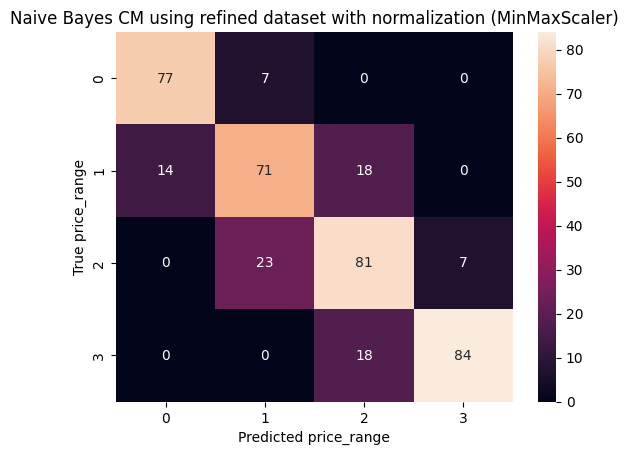

In [ ]:
gnb_sel_minmax_ax = plt.subplot()

sns.heatmap(gnb_sel_minmax_cm, annot=True, ax=gnb_sel_minmax_ax);
# labels and title
gnb_sel_minmax_ax.set_xlabel('Predicted price_range');
gnb_sel_minmax_ax.set_ylabel('True price_range');
gnb_sel_minmax_ax.set_title('Naive Bayes CM using refined dataset with normalization (MinMaxScaler)');

## Conclusion

In [ ]:
print(f'''Overall Accuracy Comparison
(Log Reg, Full Dataset, No Scale) Accuracy: {accuracy_score(y_clf_pred, Y_test):.2f}
(Log Reg, Full Dataset, Stan Scale) Accuracy: {accuracy_score(Y_scale_clf_pred, Y_test):.2f}
(Log Reg, Full Dataset, MinMax Scale) Accuracy: {accuracy_score(Y_minmax_clf_pred, Y_test):.2f}
(Log Reg, Refined Dataset, No Scale) Accuracy: {accuracy_score(Y_sel_clf_pred, Y_test):.2f}
(Log Reg, Refined Dataset, Stan Scale) Accuracy: {accuracy_score(Y_sel_scale_clf_pred, Y_test):.2f}
(Log Reg, Refined Dataset, MinMax Scale) Accuracy: {accuracy_score(Y_sel_minmax_clf_pred, Y_test):.2f}
(GNB, Full Dataset, No Scale) Accuracy: {accuracy_score(Y_gnb_pred, Y_test):.2f}
(GNB, Full Dataset, Stan Scale) Accuracy: {accuracy_score(Y_scale_gnb_pred, Y_test):.2f}
(GNB, Full Dataset, MinMax Scale) Accuracy: {accuracy_score(Y_minmax_gnb_pred, Y_test):.2f}
(GNB, Refined Dataset, No Scale) Accuracy: {accuracy_score(Y_sel_gnb_pred, Y_test):.2f}
(GNB, Refined Dataset, Stan Scale) Accuracy: {accuracy_score(Y_sel_scale_gnb_pred, Y_test):.2f}
(GNB, Refined Dataset, MinMax Scale) Accuracy: {accuracy_score(Y_sel_minmax_gnb_pred, Y_test):.2f}
''')

Overall Accuracy Comparison
(Log Reg, Full Dataset, No Scale) Accuracy: 0.70
(Log Reg, Full Dataset, Stan Scale) Accuracy: 0.95
(Log Reg, Full Dataset, MinMax Scale) Accuracy: 0.91
(Log Reg, Refined Dataset, No Scale) Accuracy: 0.95
(Log Reg, Refined Dataset, Stan Scale) Accuracy: 0.95
(Log Reg, Refined Dataset, MinMax Scale) Accuracy: 0.93
(GNB, Full Dataset, No Scale) Accuracy: 0.81
(GNB, Full Dataset, Stan Scale) Accuracy: 0.81
(GNB, Full Dataset, MinMax Scale) Accuracy: 0.81
(GNB, Refined Dataset, No Scale) Accuracy: 0.78
(GNB, Refined Dataset, Stan Scale) Accuracy: 0.78
(GNB, Refined Dataset, MinMax Scale) Accuracy: 0.78



Based on comparison made above, the following models has the highest accuracy out of the others.
- Logistic Regression, using the Full dataset and Standard Scaling
- Logistic Regression, using the Refined dataset and No Scaling
- Logistic Regression, using the Refined dataset and Standard Scaling

Hence, it can be concluded that the Logistic Regression algorithm will be better suited for the identification of the mobile price range. Also, reducing the number of attributes and introducing scaling of attributes could also lead to better accuracy of the model.